In [186]:
%load_ext autoreload
%autoreload 2
from collections import defaultdict
import pickle
import numpy as np
import sys
sys.path.append("../..")
from utils.diverse import *
from utils.data_transformations import *
from utils.visualization_tools import *
from sklearn.utils import resample

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [187]:
import plots
from plots import *

In [188]:
set_random_state(42)

# Load dataset

In [189]:
with open("../../../../main_experiment/sparse_data/dataset.pkl", "rb") as f:
    dataset = pickle.load(f)
slow_wave_ids = list(dataset["sws"].keys())
print(len(slow_wave_ids))

3030


In [190]:
dataset["sws"][slow_wave_ids[0]].keys()

dict_keys(['shape', 'hemo_aligned', 'gcamp_aligned', 'gcamp_interpolated', 'hemo_interpolated', 'correlation', 'width', 'height', 'start', 'stop', 'file_id', 'nc_start', 'nc_stop', 'left_too_high', 'iso', 'gcamp_mean_centered', 'flow_components', 'mean_sources', 'mean_sinks', 'gcamp_mean'])

In [191]:
features = ["iso", "start", "stop", "width", "height", "gcamp_interpolated", 
            "hemo_interpolated", "left_too_high", "correlation"]
iso, start, stop, width, height, gcamp, hemo, left_too_high, corr = slow_wave_features(dataset, features)

#Filter waves and get all data for filtered indices (where)
where = corr < .3
where[height < 5] = False
where[height/width < 0.1] = False
print(np.sum(where))
    
iso, start, stop, width, height, gcamp, hemo, left_too_high, corr = slow_wave_features(dataset, features, where)

204


In [192]:
#plot_examples_height_ratio(dataset, .05, start = 9, n = 1)

In [193]:
components = [dataset["sws"][id]["flow_components"]["per_wave"]["left_hemisphere"] for id in np.array(slow_wave_ids)[where]]
components = np.array(components)
relative_components = np.array([normalize(c) for c in components])
vertical_greater_horizontal = np.array([normalize(c) for c in components[:,1:3]])
ratio_vertical_horizontal = np.array([c[0]/c[2] for c in components])

# Visualize samples of the sparse data

In [9]:
#plot_examples_height_ratio(dataset, threshold = .1, start = 0, n = 10)

In [10]:
#divergence = np.load("../../../../main_experiment/helmholtz_per_wave_smooth/curl_free_function/exp_21_run_04_sw_0291.npy")
folder_curl_free_function = "../../../../main_experiment/helmholtz_per_wave_smooth/curl_free_function/"
divergence = np.load(folder_curl_free_function + "exp_21_run_00_sw_0000.npy")

sources = - divergence.copy()
sources[sources < 0] = 0
#sources = sources[:,:,:sources.shape[2]//2]

/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in less
  


In [11]:
if False:
    seg_means_left, max_y_left, max_x_left = split_sw_sources(sources[:,:,:sources.shape[2]//2], 0, segments = segments)
    seg_means_right, max_y_right, max_x_right = split_sw_sources(sources[:,:,sources.shape[2]//2:], 0, segments = segments)
    seg_means, _, _ = split_sw_sources(sources[:,:], 1, segments = segments)

/storage/michael/projects/motion_patterns/predictive_modeling/slow_wave_shape_space/plots.py:109: RuntimeWarning: invalid value encountered in less
  sources[sources < 0] = 0
/storage/michael/projects/motion_patterns/predictive_modeling/slow_wave_shape_space/plots.py:112: RuntimeWarning: invalid value encountered in less
  sinks[sinks < 0] = 0


(84,)
(82, 260, 300)


/storage/michael/projects/motion_patterns/predictive_modeling/slow_wave_shape_space/plots.py:127: RuntimeWarning: Mean of empty slice
  bg = np.nanmean(sources, axis=0)
../../utils/data_transformations.py:48: RuntimeWarning: Mean of empty slice
  mean_img = normalize_nan(np.nanmean(sources[s[0]:s[1]], axis =0))


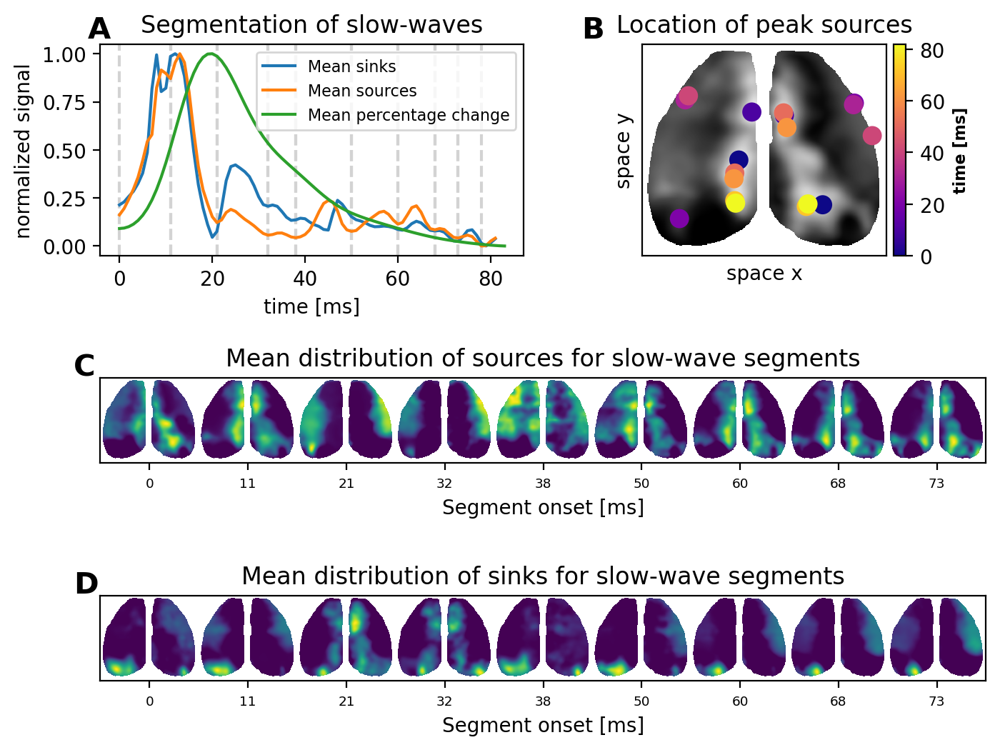

In [278]:
plot_slow_wave_dynamics(folder_curl_free_function, dataset, slow_wave_id = "exp_21_run_00_sw_0000", smoothing = .5)

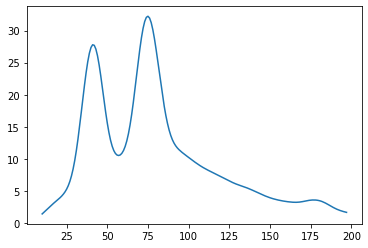

In [332]:
plt.plot(dataset["sws"]["exp_23_run_03_sw_0022"]["gcamp_mean"])

In [305]:
import warnings
warnings.filterwarnings("ignore")

(188,)
(186, 260, 300)


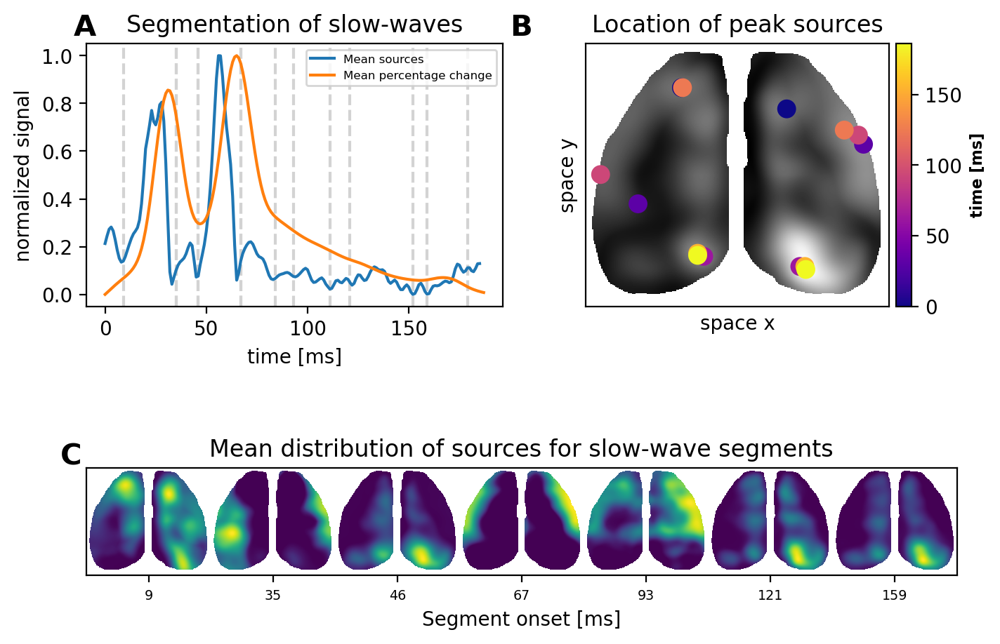

In [334]:
#plot_slow_wave_dynamics(folder_curl_free_function, dataset, slow_wave_id = "exp_23_run_03_sw_0010", smoothing = 2, plot_sinks = False)
plot_slow_wave_dynamics(folder_curl_free_function, dataset, slow_wave_id = "exp_23_run_03_sw_0022", smoothing = 2, plot_sinks = False)

In [59]:
#t = np.load("../../../../main_experiment/pc_gcamp_split_improved/exp_21_run_04_sw_0291.npy")
t = np.load("../../../../main_experiment/pc_gcamp_split_improved/exp_21_run_00_sw_0000.npy")

In [264]:
%%capture
ani = show_video(normalize_nan(t),n_frames = len(t))

In [34]:
HTML(ani)

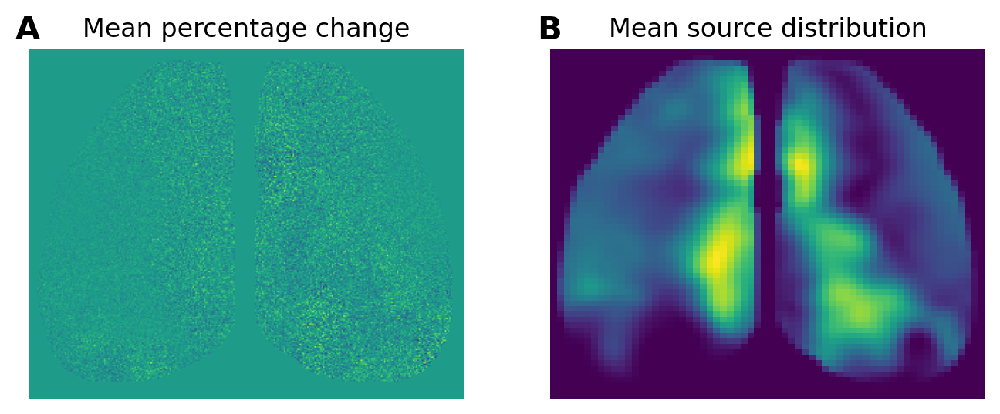

In [73]:
fig, ax = plt.subplots(1,2, figsize = (8,3), dpi = 200)

ex_mean_sources = dataset["sws"]["exp_21_run_00_sw_0000"]["mean_sources"].copy()
ex_mean_signal = np.mean(t, axis = 0)

ex_mean_signal[np.isnan(ex_mean_signal)] = 0
ax[0].imshow(ex_mean_signal, aspect = "auto")
ax[1].imshow(ex_mean_sources, aspect ="auto")

ax[0].axis("off")
ax[1].axis("off")
ax[0].set_title("Mean percentage change")
ax[1].set_title("Mean source distribution")

for i, a in enumerate(ax):
    a.text(-0.03, 1.03, string.ascii_uppercase[i], transform = a.transAxes, size= 15, weight = "bold")

#plt.imshow(dataset["sws"]["exp_21_run_04_sw_0291"]["mean_sources"])

In [53]:
import string
import io

def plot_sparse_data(dataset, slow_wave_id, show = False):
    #plt.plot(np.nanmean(t, axis = (1,2)))
    fig = plt.figure(figsize=(6,6), dpi = 200)
    #plt.subplots_adjust(0,0,1,1,wspace = .3, hspace = .3)

    gs = fig.add_gridspec(3, 2,wspace = .3, hspace = .6, left = .1) 
    ax = []

    ax_0 = fig.add_subplot(gs[0,:])
    for y in range(1,3):
        a = []
        for x in range(0,2):
            a.append(fig.add_subplot(gs[y,x]))
        ax.append(a)
    ax = np.array(ax)

    ax_0.plot(dataset["sws"][slow_wave_id]["gcamp_aligned"])
    ax_0.set_title("Mean signal in time")
    ax_0.set_ylabel("df/dt [%]")
    ax_0.set_xlabel("time [ms]")

    lrud = dataset["sws"][slow_wave_id]["flow_components"]["per_frame"]["left_hemisphere"]
    left = lrud[0]
    right = lrud[1]
    up = lrud[2]
    down = lrud[3]

    ax[0,0].set_title("Mean sources")
    ax[0,0].axis("off")
    ax[0,1].set_title("Mean sinks")
    ax[0,1].axis("off")
    ax[0,0].imshow(dataset["sws"][slow_wave_id]["mean_sources"])
    ax[0,1].imshow(dataset["sws"][slow_wave_id]["mean_sinks"])

    ax[1,1].set_xlim([np.min(-np.sqrt(left)), np.max(np.sqrt(right))])
    #ax[1,1].set_xlim([np.min(-left), np.max(right)])

    ax[1,1].plot(-np.sqrt(left), np.arange(len(left)), label="left", color = "darkblue")
    ax[1,1].plot(np.sqrt(right), np.arange(len(left)), label="right", color = "darkgreen")
    ax[1,1].plot(np.sqrt(right)-np.sqrt(left), np.arange(len(left)), color = "magenta", linestyle="--", label="mean")
    ax[1,1].set_ylabel("time [ms]")
    ax[1,1].set_xlabel("mean flow [px]")
    plt.gca().invert_yaxis()

    ax[1,0].set_title("Direction of flow (u/d)")
    ax[1,1].set_title("Direction of flow (l/r)")

    ax[1,0].plot(up, label="up", color = "darkblue")
    ax[1,0].plot(-down, label="down", color = "darkgreen")
    ax[1,0].plot(-(down -up), color = "magenta", linestyle="--", label="mean")
    ax[1,0].set_ylim([np.min(-down), np.max(up)])
    ax[1,0].set_xlabel("time [ms]")
    ax[1,0].set_ylabel("mean flow [px]")


    ax[1,0].legend(loc="lower right")
    ax[1,1].legend(loc="lower right")

    ax_0.text(-0.05, 1.05, "A", transform = ax_0.transAxes, size= 15, weight = "bold")
    for i, a in enumerate(ax.flatten()):
        if i == 1 or i == 0:
            a.text(-0.25, 1.05, string.ascii_uppercase[i+1], transform = a.transAxes, size= 15, weight = "bold")
        else:
            a.text(-0.05, 1.05, string.ascii_uppercase[i+1], transform = a.transAxes, size= 15, weight = "bold")
    
    if not show:
        fig.savefig(io.BytesIO())#Prevent showing
        plt.close(fig)
    return fig

In [54]:
#Image.fromarray(fig2rgb_array(plot_sparse_data(dataset, "exp_21_run_00_sw_0000", show = False)))

In [274]:
solenoidal_gradient_folder =  "../../../../main_experiment/helmholtz_per_wave_smooth/solenoidal_gradient/"
curl_folder =  "../../../../main_experiment/helmholtz_per_wave_smooth/solenoidal_gradient/"


def plot_vector_field(dataset, solenoidal_gradient_folder, i = 15, id = "exp_21_run_00_sw_0000"):
    fig, ax = plt.subplots(1,2, figsize = (9,3), dpi = 200)
    y_comp, x_comp = np.load(solenoidal_gradient_folder+id+".npy")
    display_combined(y_comp[i], x_comp[i],  np.sqrt(y_comp[i]**2+x_comp[i]**2), fig = fig, ax = ax[0], quivstep = 15, figsize=(5,5), scale = 20, head_width = 3)

    field_strength_in_time = np.nanmean(np.sqrt(y_comp**2+x_comp**2), axis = (1,2))
    ax[1].plot(normalize(field_strength_in_time), label = "Field strength of flow component")
    ax[1].plot(normalize(dataset["sws"][id]["shape"]), label = "Mean percentage change")
    ax[1].legend()

    ax[0].axis("off")
    ax[1].axis("on")
    
    ax[0].set_title("Vector field of flow component")
    ax[1].set_title("Mean signals in time")
    ax[1].set_xlabel("time [ms]")
    ax[1].set_ylabel("Normalized signal")
    
    
    plt.axvline(i, c = "gray", linestyle= "--")
    
    for i, a in enumerate(ax):
        a.text(-0.03, 1.03, string.ascii_uppercase[i], transform = a.transAxes, size= 15, weight = "bold")


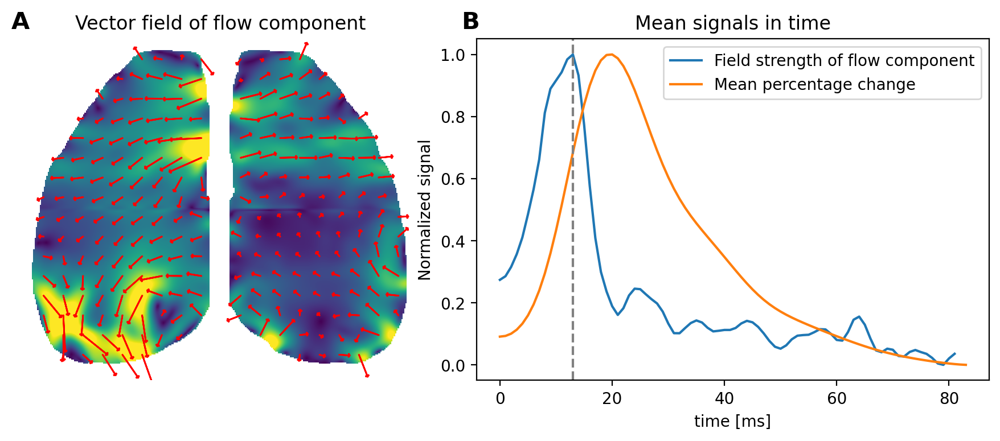

In [275]:
plot_vector_field(dataset, solenoidal_gradient_folder, i = 13, id = "exp_21_run_00_sw_0000")

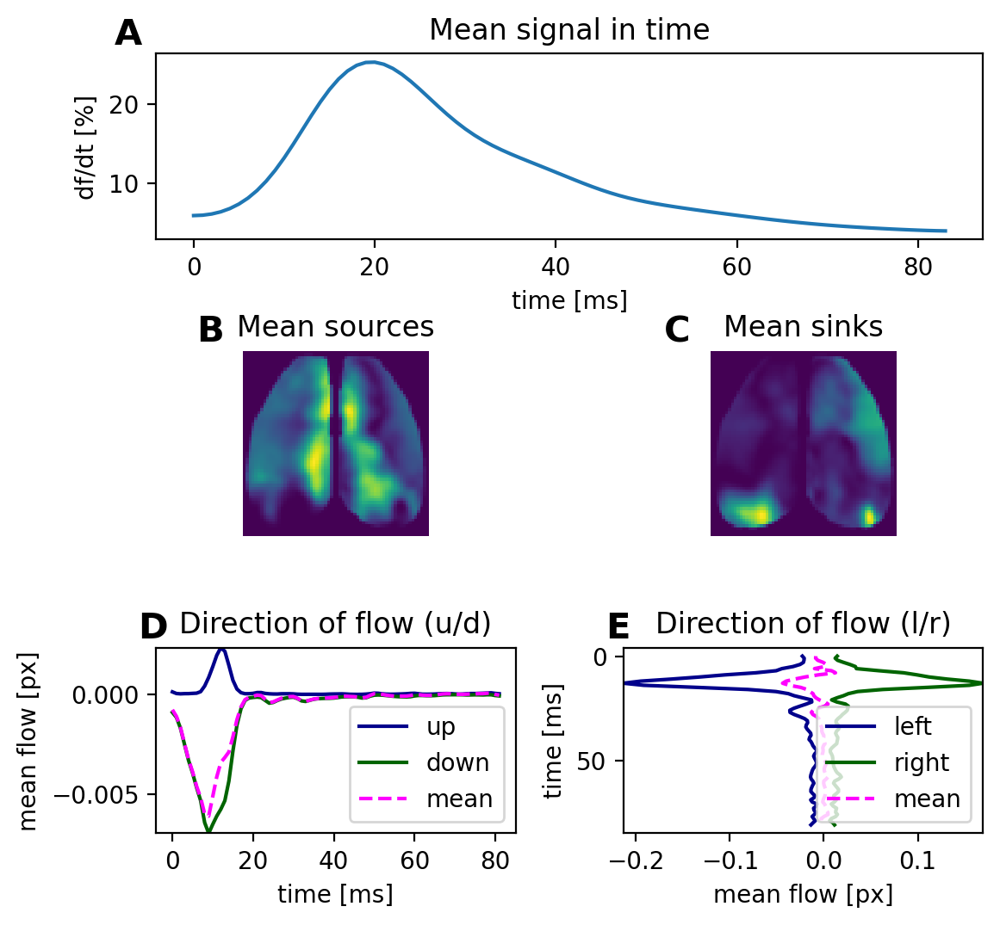

In [254]:
#plot_sparse_data(dataset, "exp_21_run_04_sw_0291")
plot_sparse_data(dataset, "exp_21_run_00_sw_0000")

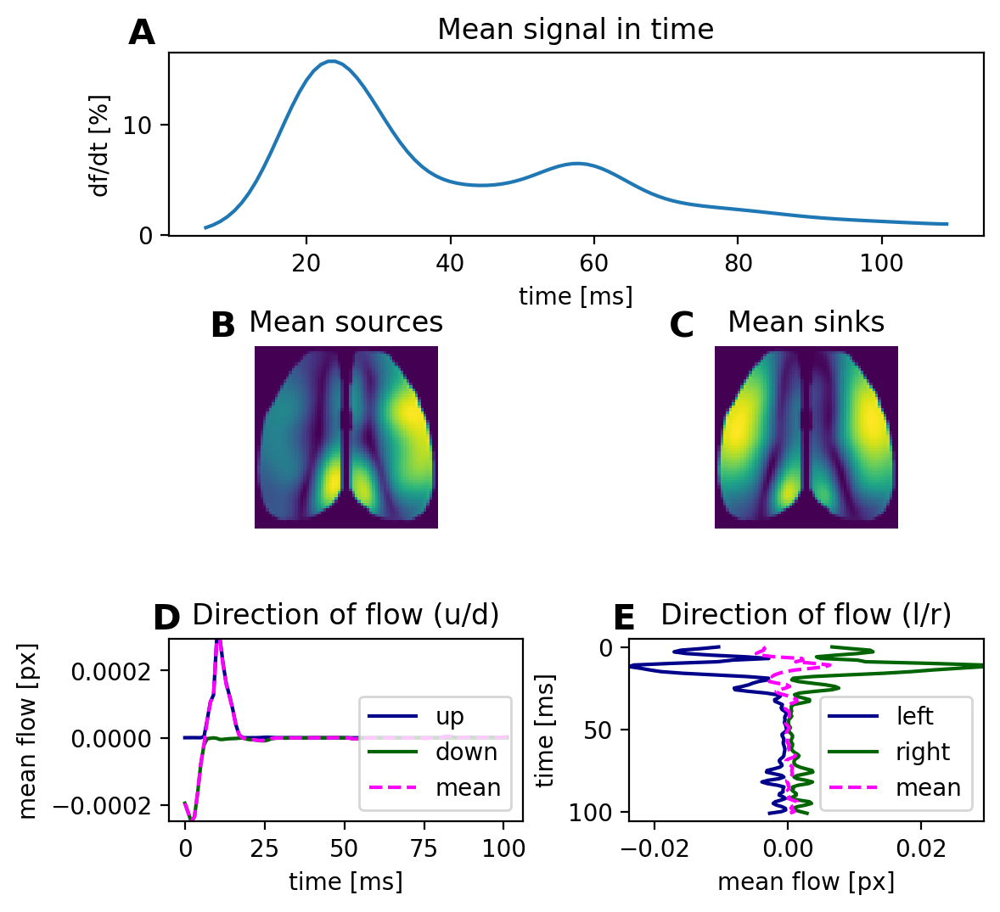

In [56]:
plot_sparse_data(dataset, "exp_21_run_04_sw_0291")


(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([-0.6032963 , -0.33679414, -0.070292  ,  0.19621015,  0.4627123 ,
         0.72921443,  0.9957166 ,  1.2622187 ,  1.5287209 ,  1.795223  ,
         2.0617251 ], dtype=float32),
 <a list of 300 Lists of Patches objects>)

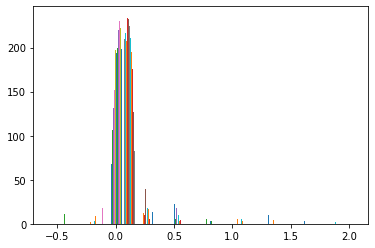

In [232]:
plt.hist(y_comp[15]**3)

In [240]:
def aggregate_components(y_comp, x_comp, epsilon = 0, left_hemisphere = True, poly = True):
   """ Aggregates positive and negative vector components for each frame or tensor"""
   if left_hemisphere:
      #vfields[n,y_comp,y,x] 
      y_comp = y_comp[:,:y_comp.shape[1]//2]
      x_comp = x_comp[:,:x_comp.shape[1]//2]
   if poly:
      x_comp = x_comp ** 3
      y_comp = y_comp ** 3

   mask = np.isnan(y_comp[0])
   sum_pixels = np.sum(~np.isnan(mask))

   down = y_comp.copy()
   down[down < 0 + epsilon] = None#Select only positive vals
   down = np.nansum(down, axis = (1,2))/sum_pixels

   up = y_comp.copy()
   up[up > 0 - epsilon] = None#Select only negative vals
   up = np.nansum(up, axis =(1,2))/sum_pixels

   left = x_comp.copy()
   left[left > 0 - epsilon] = None#select only negative vals
   left = np.nansum(left, axis = (1,2))/sum_pixels

   right = x_comp.copy()
   right[right < 0 + epsilon] = None#select only positive vals
   right = np.nansum(right, axis = (1,2))/sum_pixels
   
   return np.abs(left), np.abs(right), np.abs(up), np.abs(down)

In [241]:
left, right, up, down = aggregate_components(y_comp[:,:,:], x_comp[:,:,:])

/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in less
  from ipykernel import kernelapp as app
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in greater
/home/ibmi/gerstenberger/anaconda3/envs/condaenv/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in less


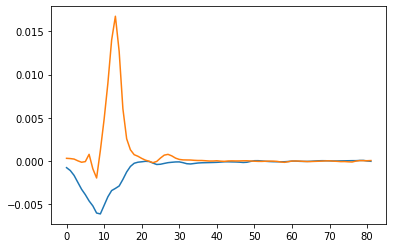

In [249]:
plt.plot(up-down)
plt.plot(left-right)

In [196]:
y_comp, x_comp = np.array([np.ones((2,2))*-1]), np.array([np.ones((2,2))*1])
#display_combined(y_comp[0], x_comp[0], np.zeros((2,2)), scale = .01, head_width = .1)
print(np.array(["left","right","up", "down"])[np.array(aggregate_components(y_comp, x_comp)).flatten().astype(np.bool)])

['right' 'up']


In [197]:
HTML(ani)